### Проект по предсказанию цены на недвижимость

__Задание:__

Используя данные из `train.csv`, построить модель для предсказания цен на недвижимость (квартиры).   
С помощью полученной модели предсказать цены для квартир из файла `test.csv`.

__Целевая переменная:__

`Price`

__Метрика:__

R2 - коэффициент детерминации (`sklearn.metrics.r2_score`)

__Сроки и условия сдачи:__

* Для успешной сдачи должны быть все предсказания (для 5000 квартир) и R2 должен быть больше 0.6.

__Примечание:__ 

Все файлы csv должны содержать названия полей (header - то есть "шапку"),
разделитель - запятая. В файлах не должны содержаться индексы из датафрейма.

Рекомендации для файла с кодом (ipynb):
1. Файл должен содержать заголовки и комментарии
2. Повторяющиеся операции лучше оформлять в виде функций
3. Не делать вывод большого количества строк таблиц (5-10 достаточно)
4. По возможности добавлять графики, описывающие данные (около 3-5)
5. Добавлять только лучшую модель, то есть не включать в код все варианты решения проекта
6. Скрипт проекта должен отрабатывать от начала и до конца (от загрузки данных до выгрузки предсказаний)
7. Весь проект должен быть в одном скрипте (файл ipynb).
8. При использовании статистик (среднее, медиана и т.д.) в качестве признаков, лучше считать их на трейне, и потом на валидационных и тестовых данных не считать статистики заново, а брать их с трейна. Если хватает знаний, можно использовать кросс-валидацию, но для сдачи этого проекта достаточно разбить данные из train.csv на train и valid.
9. Проект должен полностью отрабатывать за разумное время (не больше 10 минут), поэтому в финальный вариант лучше не включать GridSearch с перебором большого количества сочетаний параметров.
10. Допускается применение библиотек Python и моделей машинного обучения, которые были в курсе Python для Data Science. Градиентный бустинг изучается в последующих курсах, поэтому в этом проекте его применять не следует. Самая сложная из допустимых моделей - RandomForestRegressor из sklearn.

**Для чего нужно?**

*В банках, страховых компаниях:*

* Узнать истинную стоимость имущества (залога)
* Принять решение о выдаче ипотеки/страховки
* Принять решение о % по ипотеке/страховке

*На площадках объявлений (Авито, Циан, ...):*

* Найти недооцененные квартиры (~ выгодные предложения), показать их пользователям
* Показывать рыночную стоимость квартиры пользователям
* Для тех, кто продает квартиру, рекомендовать цену продажи

*Для инвесторов в недвижимость:*

* Определять рыночную стоимость квартир
* Поиск недооцененных активов
* Торговля на рынке недвижимости

### Подключение библиотек и загрузка данных

In [1]:
import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
from pylab import rcParams
import pickle
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score as r2
from sklearn.model_selection import KFold, GridSearchCV, StratifiedKFold

%matplotlib inline
%config InlineBackend.figure_format = 'svg'
# rcParams['figure.figsize'] = 10, 8
import warnings
warnings.filterwarnings('ignore')

pd.options.display.max_columns = 100

In [2]:
TRAIN_DATASET_PATH='train.csv'
TEST_DATASET_PATH='test.csv'
PREPARED_TRAIN_DATASET_PATH='train_prepared.csv'
PREPARED_TEST_DATASET_PATH='test_prepared.csv'

In [3]:
def evaluate_preds(train_true_values, train_pred_values, test_true_values, test_pred_values):

    print("Train R2:\t" + str(round(r2(train_true_values, train_pred_values), 3)))
    print("Test R2:\t" + str(round(r2(test_true_values, test_pred_values), 3)))
    
    plt.figure(figsize=(10,6))
    
    plt.subplot(121)
    sns.scatterplot(x=train_pred_values, y=train_true_values)
    plt.xlabel('Predicted values')
    plt.ylabel('True values')
    plt.title('Train sample prediction')
    
    plt.subplot(122)
    sns.scatterplot(x=test_pred_values, y=test_true_values)
    plt.xlabel('Predicted values')
    plt.ylabel('True values')
    plt.title('Test sample prediction')

    plt.show()

In [4]:
df_train = pd.read_csv(TRAIN_DATASET_PATH)
df_test = pd.read_csv(TEST_DATASET_PATH)

## Описание датасета

* Id - идентификационный номер квартиры
* DistrictId - идентификационный номер района
* Rooms - количество комнат
* Square - площадь
* LifeSquare - жилая площадь
* KitchenSquare - площадь кухни
* Floor - этаж
* HouseFloor - количество этажей в доме
* HouseYear - год постройки дома
* Ecology_1, Ecology_2, Ecology_3 - экологические показатели местности
* Social_1, Social_2, Social_3 - социальные показатели местности
* Healthcare_1, Helthcare_2 - показатели местности, связанные с охраной здоровья
* Shops_1, Shops_2 - показатели, связанные с наличием магазинов, торговых центров
* Price - цена квартиры

In [5]:
df_train.describe()

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Social_1,Social_2,Social_3,Healthcare_1,Helthcare_2,Shops_1,Price
count,10000.00000,10000.000000,10000.000000,10000.000000,7887.000000,10000.000000,10000.000000,10000.000000,1.000000e+04,10000.000000,10000.000000,10000.000000,10000.000000,5202.000000,10000.000000,10000.000000,10000.000000
mean,8383.40770,50.400800,1.890500,56.315775,37.199645,6.273300,8.526700,12.609400,3.990166e+03,0.118858,24.687000,5352.157400,8.039200,1142.904460,1.319500,4.231300,214138.857399
std,4859.01902,43.587592,0.839512,21.058732,86.241209,28.560917,5.241148,6.775974,2.005003e+05,0.119025,17.532614,4006.799803,23.831875,1021.517264,1.493601,4.806341,92872.293865
min,0.00000,0.000000,0.000000,1.136859,0.370619,0.000000,1.000000,0.000000,1.910000e+03,0.000000,0.000000,168.000000,0.000000,0.000000,0.000000,0.000000,59174.778028
25%,4169.50000,20.000000,1.000000,41.774881,22.769832,1.000000,4.000000,9.000000,1.974000e+03,0.017647,6.000000,1564.000000,0.000000,350.000000,0.000000,1.000000,153872.633942
50%,8394.50000,36.000000,2.000000,52.513310,32.781260,6.000000,7.000000,13.000000,1.977000e+03,0.075424,25.000000,5285.000000,2.000000,900.000000,1.000000,3.000000,192269.644879
75%,12592.50000,75.000000,2.000000,65.900625,45.128803,9.000000,12.000000,17.000000,2.001000e+03,0.195781,36.000000,7227.000000,5.000000,1548.000000,2.000000,6.000000,249135.462171
max,16798.00000,209.000000,19.000000,641.065193,7480.592129,2014.000000,42.000000,117.000000,2.005201e+07,0.521867,74.000000,19083.000000,141.000000,4849.000000,6.000000,23.000000,633233.466570


In [6]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 20 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             10000 non-null  int64  
 1   DistrictId     10000 non-null  int64  
 2   Rooms          10000 non-null  float64
 3   Square         10000 non-null  float64
 4   LifeSquare     7887 non-null   float64
 5   KitchenSquare  10000 non-null  float64
 6   Floor          10000 non-null  int64  
 7   HouseFloor     10000 non-null  float64
 8   HouseYear      10000 non-null  int64  
 9   Ecology_1      10000 non-null  float64
 10  Ecology_2      10000 non-null  object 
 11  Ecology_3      10000 non-null  object 
 12  Social_1       10000 non-null  int64  
 13  Social_2       10000 non-null  int64  
 14  Social_3       10000 non-null  int64  
 15  Healthcare_1   5202 non-null   float64
 16  Helthcare_2    10000 non-null  int64  
 17  Shops_1        10000 non-null  int64  
 18  Shops_2

* Id - id наблюдения, сделаем строкой
* DistrictID - номер района, показывает количество наблюдений по этому району (колво квартир), соответственно, популярность района. Скорее всего в районах, где больше всего наблюдений - будет больше население, соответственно, цена на квартиры там ниже
* Rooms - видно, что самые популярные - 1, 2 комнатные квартиры. 0 комнат - возможно, студия, нужно смотреть на все остальное. 19 комнат - очевидно, нетиповая квартира
* Square - здесь есть странные маленькие значения, плюс надо смотреть, чтобы суммарно площадь была не меньше, чем сумма площади кухни и жилой. Большая площадь тоже редкое явление. 
* LifeSquare - есть слишком маленькие площади и есть большие - выбросы, много нулей - их заполним алгоритмом 
* KitchenSquare - есть явные выбросы в виде больших площадей, 0 - вопрос (может быть, студия?)
* Floor - не должен быть выше, чем этажность дома
* HouseFloor - нулевая этажность - выбросы
* HouseYear - есть слишком старые дома 
* Shops - в спальных районах всегда больше магазинов, там скорее всего будет больше численность населения и больше квартир
* Healthcare - кол-во поликлиник в районе и расстояние до ближайшего пункта, есть много пропусков, заполним их средним значением по району
* Ecology - скорее всего коэффициент и классы
* Social - вероятно, рассояние до социальных объектов, можно посмотреть связь с DistrictId

### Обзор целевой переменной

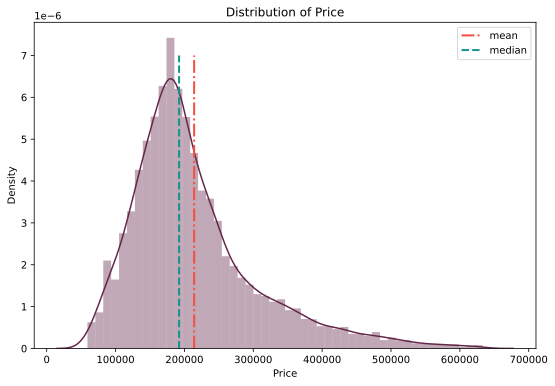

Mean price:  214138.86 
Median price:  192269.64487934904


In [7]:
price = df_train['Price']
price_mean = round(price.mean(), 2)
price_median = price.median()
price_mode = price.mode()[0]

plt.figure(figsize = (9, 6))

sns.distplot(price, color='#63264a')

y = np.linspace(0, 0.000007, 150)
plt.plot([price_mean] * 150, y, label='mean', linestyle='-.', linewidth=2, color='#F44E3F')
plt.plot([price_median] * 150, y, label='median', linestyle='--', linewidth=2, color='#129490')

plt.title('Distribution of Price')
plt.legend()
plt.show()

print('Mean price: ', price_mean, '\nMedian price: ', price_median)

Видно, что на графике распределение цен близко к нормальному, выбросов нет. Самый популярный диапазон цен - от 80000 до 280000 - скорее всего это цены на 1-2 комнатные квартиры, дешевле, возможно, студии, а дорогие встречаются реже. 

### Анализ признаков

* Square, LifeSquare, KitchenSquare

Построим графики распределения площадей. Выделим отдельный датафрейм, в котором отсортируем данные по столбцу Square. 

In [8]:
squares = df_train[['Square', 'LifeSquare', 'KitchenSquare']].sort_values('Square')
squares

,Square,LifeSquare,KitchenSquare
6392,1.136859,4.525736,1.0
8283,1.988943,2.642219,1.0
4853,2.377248,0.873147,0.0
1608,2.596351,4.604943,1.0
9294,2.954309,5.257278,1.0
...,...,...,...
1981,212.932361,211.231125,0.0
1982,275.645284,233.949309,26.0
4690,409.425181,410.639749,10.0
4262,604.705972,NaN,1.0


По таблице видно, что значения площадей меняются от ~1 до 641, при этом, в целом, суммарные значения жилой площади и площади кухни примерно совпадают со значениями площади. Если есть у Life Square значения, выходящие за пределы площади и неадекватные площади кухни - При обработке попробуем их заменить на что-то более адекватное

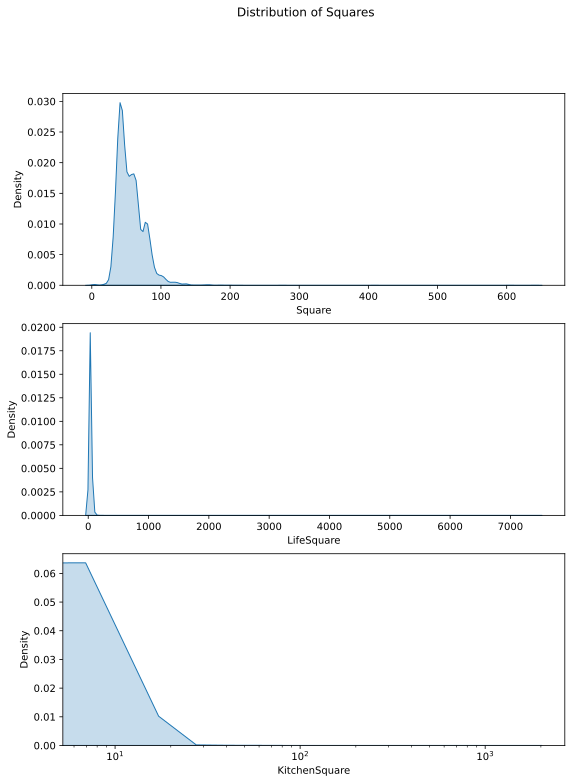

In [9]:
plt.figure(figsize = (9, 12))

plt.subplot(311)
sns.kdeplot(squares['Square'], shade=True, legend=False)
plt.xlabel('Square')

plt.subplot(312)
sns.kdeplot(squares['LifeSquare'], shade=True, legend=False)
plt.xlabel('LifeSquare')

plt.subplot(313)
sns.kdeplot(squares['KitchenSquare'], shade=True, legend=False)
plt.xscale('log')
plt.xlabel('KitchenSquare')

plt.suptitle('Distribution of Squares')
plt.show()

Видно, что у каждой из площадей есть слишком низкие и высокие значения:   
У Square - меньше 20 и больше 200  
У LifeSquare - больше 200  
У KitchenSquare - примерно больше 60 (?)  

Посмотрим на значения в разрезе целевой переменной

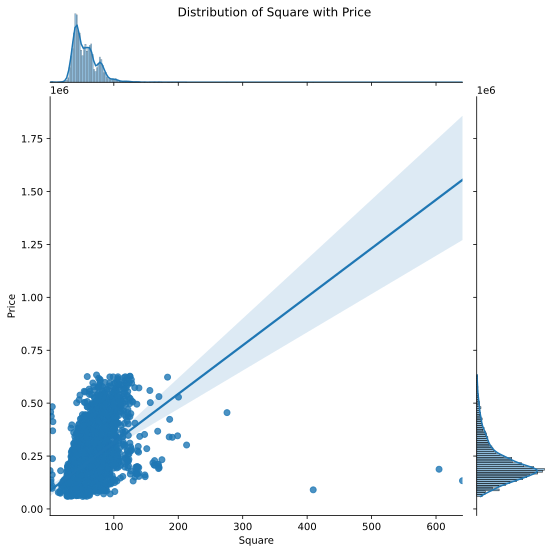

In [10]:
grid = sns.jointplot(df_train['Square'], df_train['Price'], kind='reg')
grid.fig.set_figwidth(8)
grid.fig.set_figheight(8)
plt.suptitle('Distribution of Square with Price')
plt.show()

In [11]:
df_train.loc[(df_train['Square'] > 200) | (df_train['Square'] < 15)].sort_values('Square')

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Ecology_2,Ecology_3,Social_1,Social_2,Social_3,Healthcare_1,Helthcare_2,Shops_1,Shops_2,Price
6392,14786,1,1.0,1.136859,4.525736,1.0,3,1.0,1977,0.007122,B,B,1,264,0,NaN,0,1,B,181434.825589
8283,15744,34,1.0,1.988943,2.642219,1.0,21,4.0,1977,0.069753,B,B,53,13670,4,NaN,1,11,B,458378.777006
4853,3224,27,0.0,2.377248,0.873147,0.0,1,0.0,1977,0.017647,B,B,2,469,0,NaN,0,0,B,126596.941798
1608,10202,6,1.0,2.596351,4.604943,1.0,3,25.0,2014,0.243205,B,B,5,1564,0,540.0,0,0,B,137597.601458
9294,6782,45,1.0,2.954309,5.257278,1.0,3,1.0,1977,0.195781,B,B,23,5212,6,NaN,3,2,B,438005.182323
3280,10527,27,1.0,4.380726,40.805837,1.0,10,17.0,2013,0.211401,B,B,9,1892,0,NaN,0,1,B,97560.720383
4900,4504,27,3.0,4.390331,5.610772,1.0,8,19.0,2016,0.211401,B,B,9,1892,0,NaN,0,1,B,161379.067034
9613,7657,38,1.0,4.502784,4.618547,1.0,28,1.0,1977,0.060753,B,B,15,2787,2,520.0,0,7,B,483283.488083
1316,11526,27,1.0,4.633498,1.969969,1.0,18,1.0,1977,0.011654,B,B,4,915,0,NaN,0,0,B,107604.269441
8030,13265,1,3.0,4.823679,79.767964,0.0,6,17.0,1977,0.007122,B,B,1,264,0,NaN,0,1,B,237716.681261


Выбросами будем считать площадь больше 400 и меньше 10

In [12]:
grid = sns.jointplot(df_train['LifeSquare'], df_train['Price'], kind='reg')
grid.fig.set_figwidth(8)
grid.fig.set_figheight(8)
plt.suptitle('Distribution of LifeSquare with Price')
plt.show()

In [13]:
df_train.loc[df_train['LifeSquare'] > 250].sort_values('LifeSquare')
# df_test.loc[df_test['LifeSquare'] > 250].sort_values('LifeSquare')

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Ecology_2,Ecology_3,Social_1,Social_2,Social_3,Healthcare_1,Helthcare_2,Shops_1,Shops_2,Price
590,14990,23,2.0,48.449873,263.542020,5.0,6,5.0,1972,0.075779,B,B,6,1437,3,NaN,0,2,B,141780.231857
4690,2307,102,1.0,409.425181,410.639749,10.0,4,4.0,2016,0.238617,B,B,26,3889,6,705.0,3,6,B,90470.430830
8437,15886,85,3.0,78.059331,461.463614,10.0,12,16.0,1998,0.037178,B,B,52,11217,1,2300.0,1,7,B,394253.299978
6977,11602,30,2.0,641.065193,638.163193,10.0,20,19.0,2019,0.000078,B,B,22,6398,141,1046.0,3,23,B,133529.681562
4328,16550,27,3.0,81.694417,7480.592129,1.0,9,17.0,2016,0.017647,B,B,2,469,0,NaN,0,0,B,217357.492366


Выбросами будем считать все значения меньше 10 больше 250, и те , которые больше общей площади заменим их на разницу между Square KitchenSquare

In [14]:
grid = sns.jointplot(df_train['KitchenSquare'], df_train['Price'], kind='reg')
grid.fig.set_figwidth(8)
grid.fig.set_figheight(8)
plt.suptitle('Distribution of KitchenSquare with Price')
plt.show()

In [15]:
df_train.loc[(df_train['KitchenSquare'] > 50) | (df_train['KitchenSquare'] == 0)].sort_values('KitchenSquare')

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Ecology_2,Ecology_3,Social_1,Social_2,Social_3,Healthcare_1,Helthcare_2,Shops_1,Shops_2,Price
2,4765,53,2.0,44.947953,29.197612,0.0,8,12.0,1968,0.049637,B,B,34,7759,0,229.0,1,3,B,220925.908524
6589,9731,1,2.0,52.192543,NaN,0.0,7,17.0,1977,0.007122,B,B,1,264,0,NaN,0,1,B,200573.760515
6599,9162,52,1.0,43.963230,NaN,0.0,10,17.0,1977,0.371149,B,B,34,7065,1,750.0,2,5,B,134376.081358
6607,657,6,2.0,68.556375,NaN,0.0,14,17.0,1977,0.243205,B,B,5,1564,0,540.0,0,0,B,190216.681029
6609,13491,0,1.0,38.178277,0.370619,0.0,19,17.0,2016,0.006076,B,B,30,5285,0,645.0,6,6,B,105134.286994
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4651,12552,58,3.0,116.405693,113.109653,112.0,3,3.0,2016,0.437885,B,B,23,5735,3,1084.0,0,5,B,296165.936689
2969,7441,62,3.0,114.734473,112.589083,112.0,3,3.0,2015,0.072158,B,B,2,629,1,NaN,0,0,A,315245.521059
9895,2737,27,3.0,123.430072,125.806981,123.0,5,10.0,2015,0.017647,B,B,2,469,0,NaN,0,0,B,234194.837047
8584,14679,81,1.0,32.276663,19.278394,1970.0,6,1.0,1977,0.006076,B,B,30,5285,0,645.0,6,6,B,105539.556275


In [16]:
df_train.loc[(df_train['KitchenSquare'] > 40)].sort_values('KitchenSquare')

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Ecology_2,Ecology_3,Social_1,Social_2,Social_3,Healthcare_1,Helthcare_2,Shops_1,Shops_2,Price
4588,448,48,1.0,41.186904,1.626502,41.0,2,1.0,1977,0.041125,B,B,46,9515,5,NaN,1,10,B,216882.265408
4142,15466,88,1.0,42.357487,44.779714,41.0,10,19.0,2016,0.127376,B,B,43,8429,3,NaN,3,9,B,194525.103119
3431,7111,27,2.0,139.070296,89.787666,42.0,5,3.0,2016,0.014073,B,B,2,475,0,NaN,0,0,B,153946.777452
7480,10546,62,1.0,46.013187,43.417043,43.0,4,17.0,2019,0.072158,B,B,2,629,1,NaN,0,0,A,113909.099428
1867,3267,58,3.0,138.980817,138.004600,43.0,2,2.0,1977,0.437885,B,B,23,5735,3,1084.0,0,5,B,169528.896664
551,1315,6,1.0,48.128114,45.023531,48.0,21,1.0,2013,0.243205,B,B,5,1564,0,540.0,0,0,B,146950.912410
5904,673,27,1.0,54.418214,51.498581,51.0,10,17.0,2017,0.072158,B,B,2,629,1,NaN,0,0,A,133273.635012
9889,12918,23,2.0,51.440463,53.134243,51.0,3,17.0,2017,0.005767,B,B,1,388,0,NaN,0,0,B,88150.012510
1860,4265,161,2.0,53.216778,32.644859,53.0,7,17.0,1994,0.000699,B,B,14,3369,24,4129.0,0,3,B,261125.669724
8232,7162,34,2.0,56.738764,57.510395,54.0,26,25.0,2016,0.069753,B,B,53,13670,4,NaN,1,11,B,244220.621495


* Square, LifeSquare, KitchenSquare

Посмотрим на распределение площадей по квантилям, видно, что при значении 99,9 кривая резко растет в верх, а начиная с 0,01 начинает расти


Text(0, 0.5, 'Square')

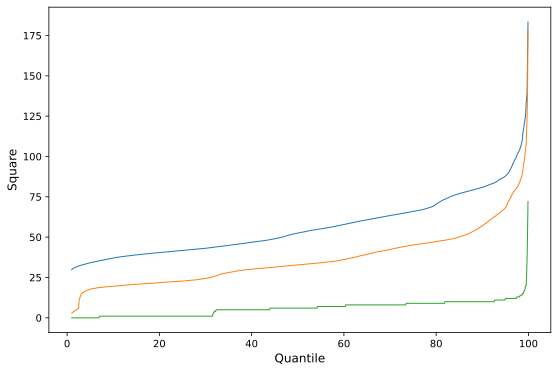

In [17]:
S = [np.percentile(df_train['Square'].dropna(), q=x) for x in np.arange(1, 100, 0.1)]
LS = [np.percentile(df_train['LifeSquare'].dropna(), q=x) for x in np.arange(1, 100, 0.1)]
KS = [np.percentile(df_train['KitchenSquare'].dropna(), q=x) for x in np.arange(1, 100, 0.1)]

plt.figure(figsize = (9, 6))
plt.plot(np.arange(1, 100, 0.1), S, linewidth=1)
plt.plot(np.arange(1, 100, 0.1), LS, linewidth=1)
plt.plot(np.arange(1, 100, 0.1), KS, linewidth=1)
plt.xlabel('Quantile', size=12)
plt.ylabel('Square', size=12)

### Предобработка данных

* `Id` - id наблюдения, сделаем строковым типом, чтобы столбец не участвовал в вычислениях

In [18]:
df_train['Id'] = df_train['Id'].astype(str)
df_test['Id'] = df_test['Id'].astype(str)

* `Square` - Выбросы - больше 400 и меньше 10 - Те данные, которые >400 удалим,  <10 пока оставим, так как в тестовых данных встречаются подобные значения.
Добавим дополнительный признак для выбросов

In [19]:
df_train['OutliersSquare'] = 0
df_train['OutliersSquare'].loc[(df_train['Square'] > 400) | (df_train['Square'] < 10)] = 1

df_test['OutliersSquare'] = 0
df_test['OutliersSquare'].loc[(df_test['Square'] > 400) | (df_test['Square'] < 10)] = 1

In [20]:
df_train = df_train.loc[df_train['Square'] < 400]

* `LifeSquare` - Выбросы - больше 250 и меньше 10 - Те данные, которые >1000 разделим на 100, те, которые >250 разделим на 10,  <10 пока оставим, так как в тестовых данных встречаются подобные значения

In [21]:
df_train['OutliersLifeSquare'] = 0
df_train['OutliersLifeSquare'].loc[(df_train['LifeSquare'] > 250) | (df_train['LifeSquare'] < 10)] = 1

df_test['OutliersLifeSquare'] = 0
df_test['OutliersLifeSquare'].loc[(df_test['LifeSquare'] > 250) | (df_test['LifeSquare'] < 10)] = 1

In [22]:
df_train['LifeSquare'].loc[df_train['LifeSquare'] > 1000] = df_train['LifeSquare'] / 100
df_train['LifeSquare'].loc[df_train['LifeSquare'] > 250] = df_train['LifeSquare'] / 10

df_test['LifeSquare'].loc[df_test['LifeSquare'] > 1000] = df_test['LifeSquare'] / 100
df_test['LifeSquare'].loc[df_test['LifeSquare'] > 250] = df_test['LifeSquare'] / 10
df_test.loc[df_test['LifeSquare'] > 250]

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Ecology_2,Ecology_3,Social_1,Social_2,Social_3,Healthcare_1,Helthcare_2,Shops_1,Shops_2,OutliersSquare,OutliersLifeSquare


Встречается ситуация, когда жилая площадь больше, чем общая - поменяем местами. Добавим дополнительный признак перепутанных значений

In [23]:
err_train = df_train['LifeSquare'] > df_train['Square']
df_train['MismatchedSquares'] = 0
df_train['MismatchedSquares'].loc[err_train] = 1

err_test = df_test['LifeSquare'] > df_test['Square']
df_test['MismatchedSquares'] = 0
df_test['MismatchedSquares'].loc[err_test] = 1

print("train:", df_train['MismatchedSquares'].value_counts(), 
      "\ntest:", df_test['MismatchedSquares'].value_counts(), sep='\n')

train:
0    9519
1     478
Name: MismatchedSquares, dtype: int64

test:
0    4760
1     240
Name: MismatchedSquares, dtype: int64


In [24]:
df_train['Square'].loc[err_train], df_train['LifeSquare'].loc[err_train] =\
df_train['LifeSquare'].loc[err_train], df_train['Square'].loc[err_train]

df_test['Square'].loc[err_test], df_test['LifeSquare'].loc[err_test] =\
df_test['LifeSquare'].loc[err_test], df_test['Square'].loc[err_test]

In [25]:
print("error in train:", df_train.loc[df_train['LifeSquare'] > df_train['Square']].values,
      "error in test:", df_test.loc[df_test['LifeSquare'] > df_test['Square']].values, sep='\n')

error in train:
[]
error in test:
[]


* `KitchenSquare` :  
1 - Площадь кухни больше, чем жилая площадь. В этом случае заменим на разницу между общей площадью и жилой. Добавим столбец с выбросами.


In [26]:
err_train_1 = df_train['KitchenSquare'] > df_train['LifeSquare']
err_train_2 = df_train['KitchenSquare'] > df_train['Square']

df_train['OutliersKitchen'] = 0
df_train['OutliersKitchen'].loc[(err_train_1) | (err_train_2)] = 1

df_train['KitchenSquare'].loc[err_train_1] = df_train['Square'].loc[err_train_1] - df_train['LifeSquare'].loc[err_train_1]


err_test_1 = df_test['KitchenSquare'] > df_test['LifeSquare']
err_test_2 = df_test['KitchenSquare'] > df_test['Square']

df_test['OutliersKitchen'] = 0
df_test['OutliersKitchen'].loc[(err_test_1) | (err_test_2)] = 1

df_test['KitchenSquare'].loc[err_test_1] = df_test['Square'].loc[err_test_1] - df_test['LifeSquare'].loc[err_test_1]

2 - Проверим еще раз первый пункт, такие данные могут возникнуть из-за слишком маленькой жилой площади (ошибка) в данных. Такие столбцы поменяем местами.

In [27]:
err_train_3 = df_train['KitchenSquare'] > df_train['LifeSquare']
df_train['LifeSquare'].loc[err_train_3], df_train['KitchenSquare'].loc[err_train_3] =\
df_train['KitchenSquare'].loc[err_train_3], df_train['LifeSquare'].loc[err_train_3]

err_test_3 = df_test['KitchenSquare'] > df_test['LifeSquare']
df_test['LifeSquare'].loc[err_test_3], df_test['KitchenSquare'].loc[err_test_3] =\
df_test['KitchenSquare'].loc[err_test_3], df_test['LifeSquare'].loc[err_test_3]

3 - Площадь кухни больше, чем общая площадь в случае нулей в жилой площади. Такие заменим на медиану

In [28]:
median = df_train['KitchenSquare'].median()
df_train['KitchenSquare'].loc[df_train['KitchenSquare'] > df_train['Square']] = median
df_test['KitchenSquare'].loc[df_test['KitchenSquare'] > df_test['Square']] = median

*  `Rooms`  - Выбросы заменим на значение, наиболее часто встречающееся для данной площади

In [29]:
# df_train['Rooms'].value_counts()
df_test['Rooms'].value_counts()

2.0     2030
1.0     1769
3.0     1099
4.0       90
5.0        7
0.0        2
6.0        2
17.0       1
Name: Rooms, dtype: int64

Мы видим, что значений 0, 5, 6, 10, 19, 17 очень мало, скорее всего такие квартиры - большая редкость, по-этому будем считать их выбросами. Видно, что среди них есть и явно ошибочные значения. Добавим дополнительный признак, в котором отметим выбросы значением 1

In [30]:
df_train['OutliersRooms'] = 0
df_train.loc[(df_train.Rooms.between(5, 19)) | (df_train.Rooms == 0), 'OutliersRooms'] = 1 

df_test['OutliersRooms'] = 0
df_test.loc[(df_test.Rooms.between(5, 19)) | (df_test.Rooms == 0), 'OutliersRooms'] = 1 

Посмотрим распределение площадей по количеству комнат (по train)

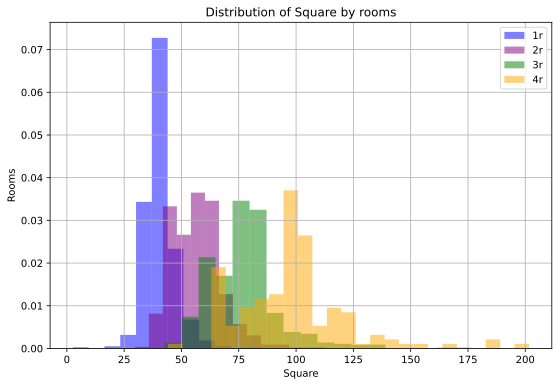

(44.0, 63.0, 83.0, 105.0)

In [31]:
rooms = df_train['Rooms']
plt.figure(figsize = (9, 6))

df_train.loc[rooms == 1, 'Square'].hist(bins=25, density=True, color ='b', alpha=0.5, label ='1r')
df_train.loc[rooms == 2, 'Square'].hist(bins=25, density=True, color ='Purple', alpha=0.5, label ='2r')
df_train.loc[rooms == 3, 'Square'].hist(bins=25, density=True, color ='g', alpha=0.5, label ='3r')
df_train.loc[rooms == 4, 'Square'].hist(bins=25, density=True, color ='Orange', alpha=0.5, label ='4r')
plt.xlabel('Square')
plt.ylabel('Rooms')
plt.title('Distribution of Square by rooms')
plt.legend()
plt.show()

quantile1 = np.around(df_train.loc[rooms == 1, 'Square'].quantile(.75))
quantile2 = np.around(df_train.loc[rooms == 2, 'Square'].quantile(.75))
quantile3 = np.around(df_train.loc[rooms == 3, 'Square'].quantile(.75))
quantile4 = np.around(df_train.loc[rooms == 4, 'Square'].quantile(.75))

quantile1, quantile2, quantile3, quantile4

Заменим количество комнат в выбросах на количество комнат, характерное для данной площади:

In [32]:
outrooms_train = df_train.loc[df_train['Rooms'].between(5, 19) | (df_train['Rooms'] == 0)]

for i in outrooms_train.index:
    if (outrooms_train.loc[(i),'Square']) < quantile1:
        (outrooms_train.loc[(i),'Rooms']) = 1
    elif (outrooms_train.loc[(i),'Square']) < quantile2:
        (outrooms_train.loc[(i),'Rooms']) = 2
    elif (outrooms_train.loc[(i),'Square']) < quantile3:
        (outrooms_train.loc[(i),'Rooms']) = 3
    elif (outrooms_train.loc[(i),'Square']) > quantile3:
        (outrooms_train.loc[(i),'Rooms']) = 4
df_train.loc[(df_train['Rooms'] == 0) | (df_train['Rooms'] > 4), 'Rooms'] = outrooms_train['Rooms']

df_train.loc[(df_train['Rooms'] == 0) | (df_train['Rooms'] > 4)]

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Ecology_2,Ecology_3,Social_1,Social_2,Social_3,Healthcare_1,Helthcare_2,Shops_1,Shops_2,Price,OutliersSquare,OutliersLifeSquare,MismatchedSquares,OutliersKitchen,OutliersRooms


Также заменим в test

In [33]:
outrooms_test = df_test.loc[df_test['Rooms'].between(5, 19) | (df_test['Rooms'] == 0)]

for i in outrooms_test.index:
    if (outrooms_test.loc[(i),'Square']) < quantile1:
        (outrooms_test.loc[(i),'Rooms']) = 1
    elif (outrooms_test.loc[(i),'Square']) < quantile2:
        (outrooms_test.loc[(i),'Rooms']) = 2
    elif (outrooms_test.loc[(i),'Square']) < quantile3:
        (outrooms_test.loc[(i),'Rooms']) = 3
    elif (outrooms_test.loc[(i),'Square']) > quantile3:
        (outrooms_test.loc[(i),'Rooms']) = 4
df_test.loc[(df_test['Rooms'] == 0) | (df_test['Rooms'] > 4), 'Rooms'] = outrooms_test['Rooms']

df_test.loc[(df_test['Rooms'] == 0) | (df_test['Rooms'] > 4)]

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Ecology_2,Ecology_3,Social_1,Social_2,Social_3,Healthcare_1,Helthcare_2,Shops_1,Shops_2,OutliersSquare,OutliersLifeSquare,MismatchedSquares,OutliersKitchen,OutliersRooms


* `LifeSquare`

В колонке жилой площади у нас есть очень много пропусков. Построим алгоритм, который предскажет нам эти значения, затем заполним ими пропуски. Предварительно добавим флаги о пустых значениях. Для обучения алгоритма заполнения пропусков будем использовать только train данные

In [34]:
df_train['NanLifeSquare'] = 0
df_train['NanLifeSquare'].loc[df_train['LifeSquare'].isnull()] = 1

df_test['NanLifeSquare'] = 0
df_test['NanLifeSquare'].loc[df_test['LifeSquare'].isnull()] = 1

In [35]:
print("train: ", df_train['NanLifeSquare'].value_counts(),
     "\ntest: ", df_test['NanLifeSquare'].value_counts(), sep='\n')

train: 
0    7885
1    2112
Name: NanLifeSquare, dtype: int64

test: 
0    3959
1    1041
Name: NanLifeSquare, dtype: int64


Построим модель после генерации новых признаков

* `HouseFloor` 

Проверим, нет ли у нас выбросов - домов, с нулевым числом этажей

In [36]:
df_train.loc[df_train['HouseFloor'] == 0]

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Ecology_2,Ecology_3,Social_1,Social_2,Social_3,Healthcare_1,Helthcare_2,Shops_1,Shops_2,Price,OutliersSquare,OutliersLifeSquare,MismatchedSquares,OutliersKitchen,OutliersRooms,NanLifeSquare
7,11993,74,2.0,80.312926,NaN,0.0,14,0.0,1977,0.075779,B,B,6,1437,3,NaN,0,2,B,221244.156664,0,0,0,0,0,1
23,6641,54,3.0,118.907612,NaN,0.0,2,0.0,1977,0.006076,B,B,30,5285,0,645.0,6,6,B,571069.052600,0,0,0,0,0,1
26,4378,27,3.0,106.958871,0.641822,0.0,17,0.0,2018,0.072158,B,B,2,629,1,NaN,0,0,A,337299.867936,0,1,0,0,0,0
39,9371,23,2.0,60.503248,NaN,0.0,16,0.0,1977,0.034656,B,B,0,168,0,NaN,0,0,B,229778.057902,0,0,0,0,0,1
44,10521,38,3.0,106.340403,104.211396,0.0,20,0.0,2017,0.060753,B,B,15,2787,2,520.0,0,7,B,435462.048070,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9707,12302,30,1.0,48.307844,46.072913,0.0,4,0.0,1977,0.000078,B,B,22,6398,141,1046.0,3,23,B,161403.094034,0,0,1,0,0,0
9769,9384,59,3.0,98.607328,NaN,0.0,14,0.0,1977,0.019509,B,B,37,7687,11,176.0,5,5,B,492700.257473,0,0,0,0,0,1
9878,11441,62,2.0,72.453232,71.985335,0.0,5,0.0,1977,0.072158,B,B,2,629,1,NaN,0,0,A,158841.624543,0,0,1,0,0,0
9908,3171,62,1.0,35.873961,NaN,0.0,25,0.0,1977,0.072158,B,B,2,629,1,NaN,0,0,A,134379.130962,0,0,0,0,0,1


заполним нули так, чтобы считалось самое часто встречающееся значение высоты домов больших, чем этаж квартиры

In [37]:
floor = df_train['Floor'].loc[df_train['HouseFloor'] == 0]
house_floor = df_train['HouseFloor'].loc[df_train['HouseFloor'] == 0]

mode1=[]
for e in floor.values:
    a = df_train['HouseFloor'].loc[df_train['HouseFloor'].values >= e].mode()[0]
    mode1.append(a)
for i in range(0, len(mode1)):
    house_floor.values[i] = mode1[i]
df_train['HouseFloor'].loc[df_train['HouseFloor'] == 0] = house_floor
    
# аналогично заполняем для теста
floor2 = df_test['Floor'].loc[df_test['HouseFloor'] == 0]
house_floor2 = df_test['HouseFloor'].loc[df_test['HouseFloor'] == 0]

mode2=[]
for et in floor2.values:
    a = df_train['HouseFloor'].loc[df_train['HouseFloor'].values >= et].mode()[0]
    mode2.append(a)
for i in range(0, len(mode2)):
    house_floor2.values[i] = mode2[i]
df_test['HouseFloor'].loc[df_test['HouseFloor'] == 0] = house_floor2

df_test.loc[df_test['HouseFloor'] == 0]

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Ecology_2,Ecology_3,Social_1,Social_2,Social_3,Healthcare_1,Helthcare_2,Shops_1,Shops_2,OutliersSquare,OutliersLifeSquare,MismatchedSquares,OutliersKitchen,OutliersRooms,NanLifeSquare


* `Floor`  

Проверим, нет ли ситуации, когда этаж квартиры выше высоты дома

In [38]:
df_train.loc[df_train['Floor'] > df_train['HouseFloor']]

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Ecology_2,Ecology_3,Social_1,Social_2,Social_3,Healthcare_1,Helthcare_2,Shops_1,Shops_2,Price,OutliersSquare,OutliersLifeSquare,MismatchedSquares,OutliersKitchen,OutliersRooms,NanLifeSquare
14,10953,27,1.0,53.769097,52.408027,1.0,5,4.0,1977,0.072158,B,B,2,629,1,NaN,0,0,A,140647.565937,0,0,0,0,0,0
16,2119,27,2.0,49.360648,31.993964,5.0,6,5.0,1983,0.051815,B,B,5,1227,0,NaN,0,0,B,117000.381287,0,0,0,0,0,0
21,11935,27,2.0,64.711835,NaN,1.0,15,1.0,1977,0.211401,B,B,9,1892,0,NaN,0,1,B,127200.026511,0,0,0,0,0,1
35,6486,200,3.0,85.280389,58.447967,9.0,6,5.0,1960,0.000000,B,B,33,7425,1,NaN,2,5,B,402871.916317,0,0,0,0,0,0
51,10103,94,1.0,35.280894,23.354176,6.0,11,9.0,1971,0.282798,B,B,33,8667,2,NaN,0,6,B,148862.210174,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9984,2237,52,3.0,64.074977,47.633428,6.0,11,9.0,1983,0.371149,B,B,34,7065,1,750.0,2,5,B,226434.880156,0,0,0,0,0,0
9985,16159,27,1.0,38.968338,NaN,1.0,10,1.0,1977,0.211401,B,B,9,1892,0,NaN,0,1,B,95529.569405,0,0,0,0,0,1
9989,4145,96,3.0,90.055233,47.860231,11.0,26,24.0,2005,0.041116,B,B,53,14892,4,NaN,1,4,B,441108.911237,0,0,0,0,0,0
9991,11553,3,3.0,101.622794,51.628780,12.0,18,17.0,2000,0.265089,B,B,37,5288,0,1937.0,3,2,B,212883.501504,0,0,0,0,0,0


Предположим, что значения были перепутаны, поменяем их местами

In [39]:
floor_err = df_train['Floor'] > df_train['HouseFloor']
df_train['Floor'].loc[floor_err], df_train['HouseFloor'].loc[floor_err] = \
df_train['HouseFloor'].loc[floor_err], df_train['Floor'].loc[floor_err]

# для теста:
floor_err2 = df_test['Floor'] > df_test['HouseFloor']
df_test['Floor'].loc[floor_err2], df_test['HouseFloor'].loc[floor_err2] = \
df_test['HouseFloor'].loc[floor_err2], df_test['Floor'].loc[floor_err2]

In [40]:
# df_train.loc[df_train['Floor'] > df_train['HouseFloor']]
df_test.loc[df_test['Floor'] > df_test['HouseFloor']]

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Ecology_2,Ecology_3,Social_1,Social_2,Social_3,Healthcare_1,Helthcare_2,Shops_1,Shops_2,OutliersSquare,OutliersLifeSquare,MismatchedSquares,OutliersKitchen,OutliersRooms,NanLifeSquare


* `HouseYear`

есть дома, которые очень старые и одно странное значение, скорее всего ошибка.  
Заменим оба года

In [41]:
df_train.loc[(df_train['HouseYear'] > 2020) | (df_train['HouseYear'] < 1900)] 
# df_test.loc[(df_test['HouseYear'] > 2020) | (df_test['HouseYear'] < 1900)] 

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Ecology_2,Ecology_3,Social_1,Social_2,Social_3,Healthcare_1,Helthcare_2,Shops_1,Shops_2,Price,OutliersSquare,OutliersLifeSquare,MismatchedSquares,OutliersKitchen,OutliersRooms,NanLifeSquare
1497,10814,109,1.0,37.265070,20.239714,9.0,9.0,12.0,20052011,0.136330,B,B,30,6141,10,262.0,3,6,B,254084.534396,0,0,0,0,0,0
4189,11607,147,2.0,44.791836,28.360393,5.0,4.0,9.0,4968,0.319809,B,B,25,4756,16,2857.0,5,8,B,243028.603096,0,0,0,0,0,0


In [42]:
df_train['HouseYear'][df_train['HouseYear'] == 4968] = 1968
df_train['HouseYear'][df_train['HouseYear'] == 20052011] = 2011

* `Healthcare_1` - заменим пустоты на медиану, добавим признак пустот

In [43]:
df_train['NanHealthcare'] = 0
df_train['NanHealthcare'].loc[df_train['Healthcare_1'].isnull()] = 1

df_test['NanHealthcare'] = 0
df_test['NanHealthcare'].loc[df_test['Healthcare_1'].isnull()] = 1

median_health = df_train['Healthcare_1'].median()

df_train['Healthcare_1'].fillna(median_health, inplace=True)
df_test['Healthcare_1'].fillna(median_health, inplace=True)

In [44]:
# удаление столбца
# df_train = df_train.drop(['Healthcare_1'], axis=1)
# df_test = df_test.drop(['Healthcare_1'], axis=1)

In [45]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9997 entries, 0 to 9999
Data columns (total 27 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Id                  9997 non-null   object 
 1   DistrictId          9997 non-null   int64  
 2   Rooms               9997 non-null   float64
 3   Square              9997 non-null   float64
 4   LifeSquare          7885 non-null   float64
 5   KitchenSquare       9997 non-null   float64
 6   Floor               9997 non-null   float64
 7   HouseFloor          9997 non-null   float64
 8   HouseYear           9997 non-null   int64  
 9   Ecology_1           9997 non-null   float64
 10  Ecology_2           9997 non-null   object 
 11  Ecology_3           9997 non-null   object 
 12  Social_1            9997 non-null   int64  
 13  Social_2            9997 non-null   int64  
 14  Social_3            9997 non-null   int64  
 15  Healthcare_1        9997 non-null   float64
 16  Helthc

In [46]:
list(df_train.columns.values) 

['Id',
 'DistrictId',
 'Rooms',
 'Square',
 'LifeSquare',
 'KitchenSquare',
 'Floor',
 'HouseFloor',
 'HouseYear',
 'Ecology_1',
 'Ecology_2',
 'Ecology_3',
 'Social_1',
 'Social_2',
 'Social_3',
 'Healthcare_1',
 'Helthcare_2',
 'Shops_1',
 'Shops_2',
 'Price',
 'OutliersSquare',
 'OutliersLifeSquare',
 'MismatchedSquares',
 'OutliersKitchen',
 'OutliersRooms',
 'NanLifeSquare',
 'nan_Healthcare']

Построим матрицу кореляций, чтобы предварительно оценить возможность создания новых признаков 

In [47]:
features = ['Rooms', 'Square', 'LifeSquare', 'KitchenSquare', 'Floor', 'HouseFloor',
            'HouseYear', 'Ecology_1', 'Ecology_2', 'Ecology_3', 'Social_1', 'Social_2', 
            'Social_3', 'Healthcare_1', 'Helthcare_2', 'Shops_1', 'Shops_2', 'Price', 'OutliersSquare',
            'OutliersLifeSquare', 'MismatchedSquares', 'OutliersKitchen', 'OutliersRooms',
            'NanLifeSquare']

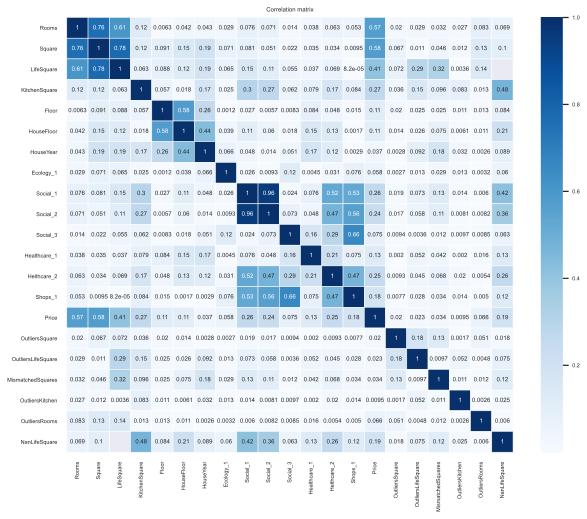

In [48]:
df_train[features].corr()
plt.figure(figsize=(10,8))

sns.set(font_scale=0.5)
sns.heatmap(df_train[features].corr().abs(), annot=True, linewidth=.5, cmap='Blues')
plt.title('Correlation matrix')
plt.show()

* Жилая и общая площади напрямую связаны с ценой
* Количество комнат также связаны с ценой, и зависит от площади
* Год постройки связан с этажностью дома и площадью (Возможно, чем старше, чем выше и больше площадь)
* Healthcare_2 сязан с Social_1 и Social_2, и все эти показатели связаны с Shops_1 - скорее всего, это спальные районы, в которых есть поликлиники и магазины


### Обработка категориальных признаков

* `Ecology_2` 
* `Ecology_3`
* `Shops_2`

In [49]:
df = pd.concat([df_train, df_test], axis=0)

In [50]:
cat_colnames = df.select_dtypes(include='object').columns.tolist()
cat_colnames

['Id', 'Ecology_2', 'Ecology_3', 'Shops_2']

In [51]:
for cat_colname in cat_colnames[1:]:
    print(str(cat_colname) + '\n\n' + \
          str(df[cat_colname].value_counts()) + \
          '\n' + '*' * 100 + '\n')

Ecology_2

B    14852
A      145
Name: Ecology_2, dtype: int64
****************************************************************************************************

Ecology_3

B    14573
A      424
Name: Ecology_3, dtype: int64
****************************************************************************************************

Shops_2

B    13760
A     1237
Name: Shops_2, dtype: int64
****************************************************************************************************



добавим новый признак, который преобразуем в биннарный (One Hot Encoding)

In [52]:
df['Ecology_Concat23'] = df['Ecology_2'] + df['Ecology_3']

In [53]:
df = pd.concat([df, pd.get_dummies(df['Ecology_Concat23'])], axis=1)
df = df.drop('Ecology_Concat23', axis=1)

заменим Колонки с A и B на 0 и 1

In [54]:
for cat_colname in cat_colnames[1:]:
    df[cat_colname][df[cat_colname].values == 'A'] = 0
    df[cat_colname][df[cat_colname].values == 'B'] = 1
    print(str(cat_colname) + '\n\n' + str(df[cat_colname].value_counts()) + '\n' + '*' * 100 + '\n')
    
df['Ecology_2'] = df['Ecology_2'].astype('int64')
df['Ecology_3'] = df['Ecology_3'].astype('int64')
df['Shops_2'] = df['Shops_2'].astype('int64')   

Ecology_2

1    14852
0      145
Name: Ecology_2, dtype: int64
****************************************************************************************************

Ecology_3

1    14573
0      424
Name: Ecology_3, dtype: int64
****************************************************************************************************

Shops_2

1    13760
0     1237
Name: Shops_2, dtype: int64
****************************************************************************************************



In [55]:
df_train = df.loc[~df['Price'].isnull()]
df_test = df.loc[df['Price'].isnull()]
df_test.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5000 entries, 0 to 4999
Data columns (total 30 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Id                  5000 non-null   object 
 1   DistrictId          5000 non-null   int64  
 2   Rooms               5000 non-null   float64
 3   Square              5000 non-null   float64
 4   LifeSquare          3959 non-null   float64
 5   KitchenSquare       5000 non-null   float64
 6   Floor               5000 non-null   float64
 7   HouseFloor          5000 non-null   float64
 8   HouseYear           5000 non-null   int64  
 9   Ecology_1           5000 non-null   float64
 10  Ecology_2           5000 non-null   int64  
 11  Ecology_3           5000 non-null   int64  
 12  Social_1            5000 non-null   int64  
 13  Social_2            5000 non-null   int64  
 14  Social_3            5000 non-null   int64  
 15  Healthcare_1        5000 non-null   float64
 16  Helthc

### Построение новых признаков

* `PriceBySquare` цена за квадратный метр

In [56]:
# пока не буду добавлять признак, для него нужна отдельная модель
# df_train['PriceBySquare'] = df_train['Price'] / df_train['Square']

* `MeanSquareByRooms` средняя площадь квартир по комнатам

In [57]:
gp = df_train.groupby(['Rooms'])['Square'].mean()
df_train["MeanSquareByRooms"] = df_train['Rooms'].map(gp.to_dict())
df_test["MeanSquareByRooms"] = df_test['Rooms'].map(gp.to_dict())
gp

Rooms
1.0     41.353064
2.0     56.577969
3.0     77.009464
4.0    102.558169
Name: Square, dtype: float64

* `DeviaSquareByRooms` отклонение от средней площади

In [58]:
df_train['DeviaSquareByRooms'] = df_train['Square'] - df_train['MeanSquareByRooms']
df_test['DeviaSquareByRooms'] = df_test['Square'] - df_test['MeanSquareByRooms']

* `RatioSquareToMean` - отношение площади к средней площади по комнатам

In [59]:
df_train['RatioSquareToMean'] = df_train['Square'] / df_train['MeanSquareByRooms'] - 1
df_test['RatioSquareToMean'] = df_test['Square'] / df_test['MeanSquareByRooms'] - 1

* `DistrictSize` - размер района по количеству наблюдений

In [60]:
DistrictSize = df_train['DistrictId'].value_counts().reset_index()\
               .rename(columns={'index':'DistrictId', 'DistrictId':'DistrictSize'})
df_train = df_train.merge(DistrictSize, on='DistrictId', how='left')
df_test = df_test.merge(DistrictSize, on='DistrictId', how='left')
df_test['DistrictSize'].fillna(0, inplace=True)

* `MedPriceByDistrict` - средняя цена по району

In [61]:
MedPriceByDistrict = df_train.groupby(['DistrictId', 'Rooms'], as_index=False).agg({'Price':'median'})\
                       .rename(columns={'Price':'MedPriceByDistrict'})
df_train = df_train.merge(MedPriceByDistrict, on=['DistrictId', 'Rooms'], how='left')
median = df_train['MedPriceByDistrict'].median()
df_test = df_test.merge(MedPriceByDistrict, on=['DistrictId', 'Rooms'], how='left')
df_test['MedPriceByDistrict'].fillna(median, inplace=True)

* `MedPriceByHouseYear` - средняя цена квартиры, в зависимости от года постройки

In [62]:
MedPriceByHouseYear = df_train.groupby(['HouseYear', 'Rooms'], as_index=False).agg({'Price':'median'})\
                       .rename(columns={'Price':'MedPriceByHouseYear'})
df_train = df_train.merge(MedPriceByHouseYear, on=['HouseYear', 'Rooms'], how='left')

median = df_train['MedPriceByHouseYear'].median()
df_test = df_test.merge(MedPriceByHouseYear, on=['HouseYear', 'Rooms'], how='left')
df_test['MedPriceByHouseYear'].fillna(median, inplace=True)

In [63]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5000 entries, 0 to 4999
Data columns (total 36 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Id                   5000 non-null   object 
 1   DistrictId           5000 non-null   int64  
 2   Rooms                5000 non-null   float64
 3   Square               5000 non-null   float64
 4   LifeSquare           3959 non-null   float64
 5   KitchenSquare        5000 non-null   float64
 6   Floor                5000 non-null   float64
 7   HouseFloor           5000 non-null   float64
 8   HouseYear            5000 non-null   int64  
 9   Ecology_1            5000 non-null   float64
 10  Ecology_2            5000 non-null   int64  
 11  Ecology_3            5000 non-null   int64  
 12  Social_1             5000 non-null   int64  
 13  Social_2             5000 non-null   int64  
 14  Social_3             5000 non-null   int64  
 15  Healthcare_1         5000 non-null   f

* `MedPricePerM2ByHouseYear` - средняя цена за 1 м2 в зависимости от года постройки

In [64]:
df_train['MedPricePerM2ByHouseYear'] = df_train['MedPriceByHouseYear'] / df_train['Square']
df_test['MedPricePerM2ByHouseYear'] = df_test['MedPriceByHouseYear'] / df_test['Square']

* `MedPricePerM2ByDistrict` - средняя цена за 1 м2 по району

In [65]:
df_train['MedPricePerM2ByDistrict'] = df_train['MedPriceByDistrict'] / df_train['Square']
df_test['MedPricePerM2ByDistrict'] = df_test['MedPriceByDistrict'] / df_test['Square']

* `MedPriceByRooms` - средняя цена по комнатам (возможно, лучше удалить)

In [66]:
# возможно, лучше удалить
MedPriceByRooms = df_train.groupby(['Rooms'], as_index=False).agg({'Price':'median'})\
                       .rename(columns={'Price':'MedPriceByRooms'})
df_train = df_train.merge(MedPriceByRooms, on=['Rooms'], how='left')
df_test = df_test.merge(MedPriceByRooms, on=['Rooms'], how='left')

* `MedSquareByRoomsDist` - средняя площадь по комнатам

In [67]:
MedSquareByRoomsDist = df_train.groupby(['DistrictId', 'Rooms'], as_index=False).agg({'Square':'median'})\
                       .rename(columns={'Square':'MedSquareByRoomsDist'})
df_train = df_train.merge(MedSquareByRoomsDist, on=['DistrictId', 'Rooms'], how='left')
median = df_train['MedSquareByRoomsDist'].median()
df_test = df_test.merge(MedSquareByRoomsDist, on=['DistrictId', 'Rooms'], how='left')
df_test['MedSquareByRoomsDist'].fillna(median, inplace=True)

* `MedPriceByRoomsDist` - средняя цена по району за квартиру по количеству комнат 

In [68]:
MedPriceByRoomsDist = df_train.groupby(['DistrictId', 'MedSquareByRoomsDist'], as_index=False).agg({'Price':'median'})\
                       .rename(columns={'Price':'MedPriceByRoomsDist'})
df_train = df_train.merge(MedPriceByRoomsDist, on=['DistrictId', 'MedSquareByRoomsDist'], how='left')
median = df_train['MedPriceByRoomsDist'].median()
df_test = df_test.merge(MedPriceByRoomsDist, on=['DistrictId', 'MedSquareByRoomsDist'], how='left')
df_test['MedPriceByRoomsDist'].fillna(median, inplace=True)

* `HealthcareToSocialToSocial` - социальные показатели в каждой из категорий здравоохранения

In [69]:
HealthcareToSocial = df_train.groupby(['Helthcare_2'], as_index=False)\
                    .agg({'Social_1':lambda x:x.value_counts().index[0]})\
                    .rename(columns={'Social_1':'HealthcareToSocial'})
df_train = df_train.merge(HealthcareToSocial, on='Helthcare_2', how='left')
df_test = df_test.merge(HealthcareToSocial, on='Helthcare_2', how='left')

* `IsDistrictLarge` размер района

In [70]:
df_train['IsDistrictLarge'] = (df_train['DistrictSize'] > 100).astype(int)
df_test['IsDistrictLarge'] = (df_test['DistrictSize'] > 100).astype(int)

In [71]:
df_train.IsDistrictLarge.value_counts()

1    5067
0    4930
Name: IsDistrictLarge, dtype: int64

* `DistrictId` - id района, сделаем строкой

In [72]:
df_train['DistrictId'] = df_train['DistrictId'].astype(str)
df_test['DistrictId'] = df_test['DistrictId'].astype(str)

* `TotalAppartsByYear` - суммарное количество квартир по году постройки дома

In [73]:
TotalAppartsByYear = df_train['HouseYear'].value_counts().reset_index()\
                    .rename(columns={'index':'HouseYear', 'HouseYear':'TotalAppartsByYear'})
df_train = df_train.merge(TotalAppartsByYear, on='HouseYear', how='left')
df_test = df_test.merge(TotalAppartsByYear, on='HouseYear', how='left')
df_test['TotalAppartsByYear'].fillna(0, inplace=True)

* `IsHouseOld` - категодия дома в зависимости от его возраста (1 - старый дом, 0 - современный)

In [74]:
df_train['IsHouseOld'] = (df_train['HouseYear'] < 1970).astype(int)
df_test['IsHouseOld'] = (df_test['HouseYear'] < 1970).astype(int)

* `IsHouseYearPopular` - популярен ли год постройки

In [75]:
df_train['IsHouseYearPopular'] = (df_train['TotalAppartsByYear'] > 100).astype(int)
df_test['IsHouseYearPopular'] = (df_test['TotalAppartsByYear'] > 100).astype(int)

In [76]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5000 entries, 0 to 4999
Data columns (total 46 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Id                        5000 non-null   object 
 1   DistrictId                5000 non-null   object 
 2   Rooms                     5000 non-null   float64
 3   Square                    5000 non-null   float64
 4   LifeSquare                3959 non-null   float64
 5   KitchenSquare             5000 non-null   float64
 6   Floor                     5000 non-null   float64
 7   HouseFloor                5000 non-null   float64
 8   HouseYear                 5000 non-null   int64  
 9   Ecology_1                 5000 non-null   float64
 10  Ecology_2                 5000 non-null   int64  
 11  Ecology_3                 5000 non-null   int64  
 12  Social_1                  5000 non-null   int64  
 13  Social_2                  5000 non-null   int64  
 14  Social_3

Удалим малонаселенные районы

In [77]:
# df_test.info()
# df_train = df_train.loc[df_train['DistrictSize'] > 50]

### Заполним нули LifeSquare моделью

In [79]:
columns = df_train.columns.to_list()[2:]
columns.remove('LifeSquare')
columns.remove('Price')
columns

['Rooms',
 'Square',
 'KitchenSquare',
 'Floor',
 'HouseFloor',
 'HouseYear',
 'Ecology_1',
 'Ecology_2',
 'Ecology_3',
 'Social_1',
 'Social_2',
 'Social_3',
 'Healthcare_1',
 'Helthcare_2',
 'Shops_1',
 'Shops_2',
 'OutliersSquare',
 'OutliersLifeSquare',
 'MismatchedSquares',
 'OutliersKitchen',
 'OutliersRooms',
 'NanLifeSquare',
 'nan_Healthcare',
 'AB',
 'BA',
 'BB',
 'MeanSquareByRooms',
 'DeviaSquareByRooms',
 'RatioSquareToMean',
 'DistrictSize',
 'MedPriceByDistrict',
 'MedPriceByHouseYear',
 'MedPricePerM2ByHouseYear',
 'MedPricePerM2ByDistrict',
 'MedPriceByRooms',
 'MedSquareByRoomsDist',
 'MedPriceByRoomsDist',
 'HealthcareToSocial',
 'IsDistrictLarge',
 'TotalAppartsByYear',
 'IsHouseOld',
 'IsHouseYearPopular']

In [80]:
features_LS = columns
target_LS = 'LifeSquare'

X_train_LS = df_train[features_LS].loc[df_train[target_LS].notnull()]
Y_train_LS = df_train[target_LS].loc[df_train[target_LS].notnull()]
X_test_LS = df_train[features_LS].loc[df_train[target_LS].isnull()]
X_test_LS2 = df_test[features_LS].loc[df_test[target_LS].isnull()]

# X_train, X_test, y_train, y_test = train_test_split(X_train_LS, Y_train_LS, shuffle=True, test_size=0.3, random_state=21)

In [81]:
rf_for_LS = RandomForestRegressor(max_depth=7, max_features=11, n_estimators=300, random_state=42)
# rf_for_LS.fit(X_train, y_train)

rf_for_LS.fit(X_train_LS, Y_train_LS)

# Y_test_LS = lr_for_LS.predict(X_test_LS)
# Y_train_preds = rf_for_LS.predict(X_train)
# Y_test_preds = rf_for_LS.predict(X_test)

# evaluate_preds(y_train, Y_train_preds, y_test, Y_test_preds)

RandomForestRegressor(max_depth=7, max_features=11, n_estimators=300,
                      random_state=42)

In [82]:
df_train.loc[df_train['LifeSquare'].isnull(), 'LifeSquare'] = rf_for_LS.predict(X_test_LS)
df_test.loc[df_test['LifeSquare'].isnull(), 'LifeSquare'] = rf_for_LS.predict(X_test_LS2) 

In [83]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5000 entries, 0 to 4999
Data columns (total 46 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Id                        5000 non-null   object 
 1   DistrictId                5000 non-null   object 
 2   Rooms                     5000 non-null   float64
 3   Square                    5000 non-null   float64
 4   LifeSquare                5000 non-null   float64
 5   KitchenSquare             5000 non-null   float64
 6   Floor                     5000 non-null   float64
 7   HouseFloor                5000 non-null   float64
 8   HouseYear                 5000 non-null   int64  
 9   Ecology_1                 5000 non-null   float64
 10  Ecology_2                 5000 non-null   int64  
 11  Ecology_3                 5000 non-null   int64  
 12  Social_1                  5000 non-null   int64  
 13  Social_2                  5000 non-null   int64  
 14  Social_3

* `RatioLifeSquareToSquare` - доля жилой площади к общей

In [84]:
df_train['RatioLifeSquareToSquare'] = df_train['LifeSquare'] / df_train['Square']
df_test['RatioLifeSquareToSquare'] = df_test['LifeSquare'] / df_test['Square']

* `MeanLifeSquareByRooms` - доля жилой площади к общей

In [85]:
MeanLifeSquareByRooms = df_train.groupby(['Rooms'])['LifeSquare'].mean()
df_train["MeanLifeSquareByRooms"] = df_train['Rooms'].map(MeanLifeSquareByRooms.to_dict())
df_test["MeanLifeSquareByRooms"] = df_test['Rooms'].map(MeanLifeSquareByRooms.to_dict())
MeanLifeSquareByRooms

Rooms
1.0    27.129627
2.0    39.145454
3.0    54.033115
4.0    70.237542
Name: LifeSquare, dtype: float64

### Нормализация признаков

In [92]:
from sklearn.preprocessing import MinMaxScaler

In [95]:
scaler = MinMaxScaler()
columns_for_scaling = [ 'Rooms', 'Square', 'LifeSquare', 'KitchenSquare', 'Floor', 'HouseFloor',
                        'HouseYear', 'Social_1', 'Social_2', 'Social_3', 'Healthcare_1', 'Helthcare_2',
                        'Shops_1', 'MeanSquareByRooms', 'DeviaSquareByRooms', 'RatioSquareToMean',
                        'DistrictSize', 'MedPriceByDistrict', 'MedPriceByHouseYear', 'MedPricePerM2ByHouseYear',
                        'MedPricePerM2ByDistrict', 'MedPriceByRooms', 'MedSquareByRoomsDist', 'MedPriceByRoomsDist',
                        'HealthcareToSocial',  'TotalAppartsByYear',  'RatioLifeSquareToSquare', 'MeanLifeSquareByRooms']

df_train_scaled = df_train.copy()
df_test_scaled = df_test.copy()

df_train_scaled[columns_for_scaling] = scaler.fit_transform(df_train_scaled[columns_for_scaling])
df_test_scaled[columns_for_scaling] = scaler.transform(df_test_scaled[columns_for_scaling])

### Визуализация данных (характеристики района)

Уменьшим размерность данных, чтобы визуализировать из на графике

In [99]:
df_train_scaled.columns

Index(['Id', 'DistrictId', 'Rooms', 'Square', 'LifeSquare', 'KitchenSquare',
       'Floor', 'HouseFloor', 'HouseYear', 'Ecology_1', 'Ecology_2',
       'Ecology_3', 'Social_1', 'Social_2', 'Social_3', 'Healthcare_1',
       'Helthcare_2', 'Shops_1', 'Shops_2', 'Price', 'OutliersSquare',
       'OutliersLifeSquare', 'MismatchedSquares', 'OutliersKitchen',
       'OutliersRooms', 'NanLifeSquare', 'nan_Healthcare', 'AB', 'BA', 'BB',
       'MeanSquareByRooms', 'DeviaSquareByRooms', 'RatioSquareToMean',
       'DistrictSize', 'MedPriceByDistrict', 'MedPriceByHouseYear',
       'MedPricePerM2ByHouseYear', 'MedPricePerM2ByDistrict',
       'MedPriceByRooms', 'MedSquareByRoomsDist', 'MedPriceByRoomsDist',
       'HealthcareToSocial', 'IsDistrictLarge', 'TotalAppartsByYear',
       'IsHouseOld', 'IsHouseYearPopular', 'RatioLifeSquareToSquare',
       'MeanLifeSquareByRooms'],
      dtype='object')

In [94]:
from sklearn.manifold import TSNE

In [124]:
col_for_viz = ['Ecology_1', 'Ecology_2', 'Ecology_3', 'Social_1', 
               'Social_2', 'Social_3', 'Healthcare_1','Helthcare_2', 
               'Shops_1', 'Shops_2', 'AB', 'BA', 'BB',  'HealthcareToSocial', 'DistrictSize']
# 
tsne = TSNE(n_components=2, learning_rate=50, random_state=42)
df_train_tsne = tsne.fit_transform(df_train_scaled[col_for_viz])
df_train_tsne.shape

(9997, 2)

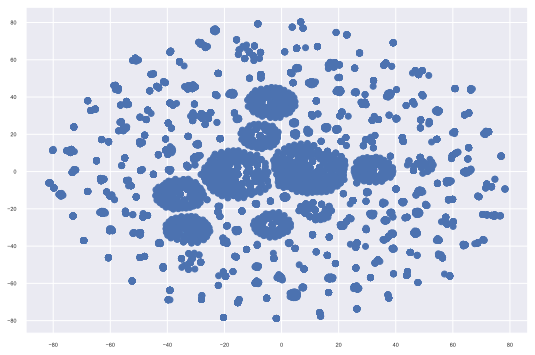

In [125]:
plt.figure(figsize=(9, 6))

plt.scatter(df_train_tsne[:, 0], df_train_tsne[:, 1])
plt.show()

In [121]:
from sklearn.decomposition import PCA

In [126]:
pca = PCA(n_components=2, random_state=42)

df_train_pca = pca.fit_transform(df_train_scaled[col_for_viz])
df_train_pca.shape

(9997, 2)

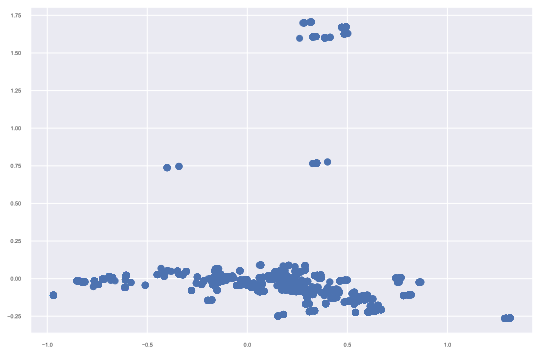

In [127]:
plt.figure(figsize=(9, 6))

plt.scatter(df_train_pca[:, 0], df_train_pca[:, 1])
plt.show()

### Визуализация данных (все данные)

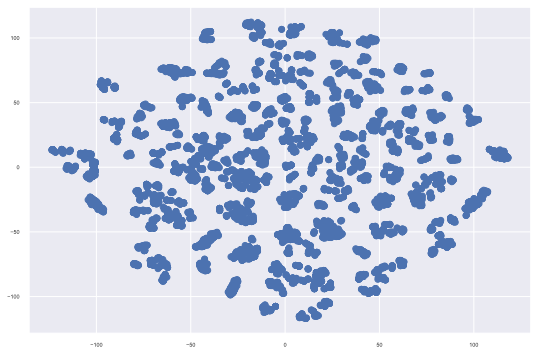

In [163]:
tsne = TSNE(n_components=2, learning_rate=1000, random_state=42)
cols = df_train_scaled.drop('Price', axis=1).columns.to_list()[2:]

df_train_tsne = tsne.fit_transform(df_train_scaled[cols])

plt.figure(figsize=(9, 6))
plt.scatter(df_train_tsne[:, 0], df_train_tsne[:, 1])
plt.show()

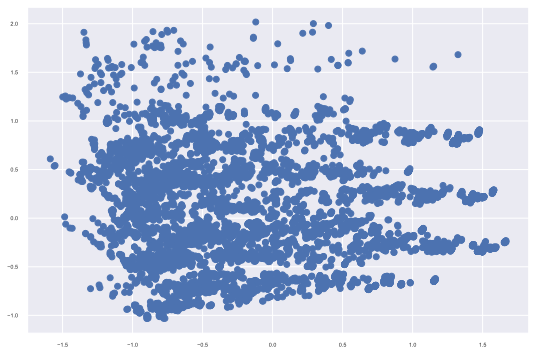

In [161]:
pca = PCA(n_components=2, random_state=42)
df_train_pca = pca.fit_transform(df_train_scaled[cols])

plt.figure(figsize=(9, 6))

plt.scatter(df_train_pca[:, 0], df_train_pca[:, 1])
plt.show()

In [91]:
df_train.describe()

,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Ecology_2,Ecology_3,Social_1,Social_2,Social_3,Healthcare_1,Helthcare_2,Shops_1,Shops_2,Price,OutliersSquare,OutliersLifeSquare,MismatchedSquares,OutliersKitchen,OutliersRooms,NanLifeSquare,nan_Healthcare,AB,BA,BB,MeanSquareByRooms,DeviaSquareByRooms,RatioSquareToMean,DistrictSize,MedPriceByDistrict,MedPriceByHouseYear,MedPricePerM2ByHouseYear,MedPricePerM2ByDistrict,MedPriceByRooms,MedSquareByRoomsDist,MedPriceByRoomsDist,HealthcareToSocial,IsDistrictLarge,TotalAppartsByYear,IsHouseOld,IsHouseYearPopular,RatioLifeSquareToSquare,MeanLifeSquareByRooms
count,9997.000000,9997.000000,9997.000000,9997.000000,9997.000000,9997.000000,9997.000000,9997.000000,9997.000000,9997.000000,9997.000000,9997.000000,9997.000000,9997.000000,9997.000000,9997.000000,9997.000000,9997.000000,9997.000000,9997.000000,9997.000000,9997.000000,9997.000000,9997.000000,9997.000000,9997.000000,9997.000000,9997.000000,9997.000000,9.997000e+03,9.997000e+03,9997.000000,9997.000000,9997.000000,9997.000000,9997.000000,9997.000000,9997.000000,9997.000000,9997.000000,9997.000000,9997.000000,9997.000000,9997.000000,9997.000000,9997.000000
mean,1.886366,56.274986,38.541738,5.819157,7.941582,13.668200,1984.860558,0.118853,0.990297,0.972492,24.687106,5352.169551,8.026808,1026.488747,1.319096,4.229269,0.917475,214161.934244,0.001200,0.020806,0.047814,0.002301,0.003001,0.211263,0.479944,0.009703,0.027508,0.962789,56.274986,9.323412e-14,1.614127e-15,242.273582,211537.021455,205151.577919,3817.508796,3943.776446,201823.118714,55.594334,211537.021455,23.071521,0.506852,807.875863,0.175953,0.735421,0.677060,38.541738
std,0.805947,19.175984,17.981213,4.825981,5.226807,6.030787,18.409066,0.119030,0.098029,0.163567,17.535219,4007.359551,23.798206,746.701412,1.493620,4.803361,0.275176,92874.114626,0.034627,0.142742,0.213384,0.047913,0.054701,0.408225,0.499623,0.098029,0.163567,0.189288,14.664984,1.235543e+01,2.154503e-01,269.018553,76518.963852,63956.990820,1348.197909,1741.918922,48421.178339,16.561700,76518.963852,22.064980,0.499978,1109.145696,0.380799,0.441131,0.171279,10.915361
min,1.000000,2.377248,0.370619,0.000000,1.000000,1.000000,1910.000000,0.000000,0.000000,0.000000,0.000000,168.000000,0.000000,0.000000,0.000000,0.000000,0.000000,59174.778028,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,41.353064,-7.139869e+01,-9.425134e-01,1.000000,78030.684516,69623.753191,804.402076,625.091359,154967.657981,27.273890,78030.684516,2.000000,0.000000,1.000000,0.000000,0.000000,0.006001,27.129627
25%,1.000000,41.866191,25.445806,1.000000,4.000000,9.000000,1974.000000,0.017647,1.000000,1.000000,6.000000,1564.000000,0.000000,830.000000,0.000000,1.000000,1.000000,153893.979077,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,41.353064,-6.937182e+00,-1.345923e-01,55.000000,165071.825722,163933.392556,3009.565774,3005.591389,154967.657981,42.057160,165071.825722,2.000000,0.000000,96.000000,0.000000,0.000000,0.575103,27.129627
50%,2.000000,52.619125,34.595899,6.000000,7.000000,14.000000,1977.000000,0.075424,1.000000,1.000000,25.000000,5285.000000,2.000000,900.000000,1.000000,3.000000,1.000000,192302.751941,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,56.577969,-5.870797e-01,-1.146859e-02,104.000000,195641.106322,186543.765047,3919.883910,3840.592147,200378.608978,50.044329,195641.106322,22.000000,1.000000,163.000000,0.000000,1.000000,0.651681,39.145454
75%,2.000000,65.986604,47.761990,9.000000,11.000000,17.000000,2001.000000,0.195781,1.000000,1.000000,36.000000,7227.000000,5.000000,990.000000,2.000000,6.000000,1.000000,249174.529858,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,1.000000,56.577969,4.994490e+00,8.714048e-02,511.000000,241068.903045,231464.510346,4439.477868,4603.274130,200378.608978,64.365814,241068.903045,53.000000,1.000000,2651.000000,0

### Построение модели кластеризации

In [151]:
from sklearn.cluster import KMeans

In [164]:
# для всех признаков (пока не вижу смысла так строить, потому что явных кластеров нет)
kmeans = KMeans(n_clusters=4, random_state=42)
cluster_labels_train = kmeans.fit_predict(df_train_scaled[cols])
cluster_labels_test = kmeans.predict(df_test_scaled[cols])

17620.343258855053
15881.830524863726
14595.137096722323
13656.956909294151
12714.953041128902
12106.143467769194
11522.011019696763
11098.99892921388
10560.01260660906
10262.264511721354
9798.03068073823
9567.98479995943
9251.74425549902
8901.744139353174
8766.441087719713
8560.046479099445
8314.42750919217
8136.389869403481


Text(0.5, 1.0, 'Inertia')

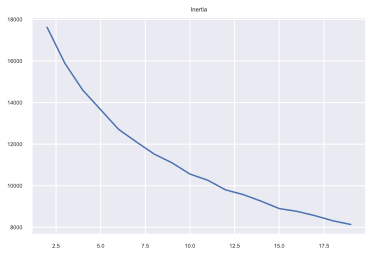

In [167]:
inertia_arr = []
for i in range(2, 20):
    tmp_model = KMeans(n_clusters=i, random_state=42)
    tmp_model.fit(df_train_scaled[cols])
    tmp_inertia = tmp_model.inertia_
    print(tmp_inertia)
    inertia_arr.append(tmp_inertia)
    
plt.plot([i for i in range(2,20)], inertia_arr)
plt.title('Inertia')

In [170]:
# для признаков по району (тоже слабо, но кучкуются)
kmeans = KMeans(n_clusters=10, random_state=42)
cluster_dist_labels_train = kmeans.fit_predict(df_train_scaled[col_for_viz])
cluster_dist_labels_test = kmeans.predict(df_test_scaled[col_for_viz])

In [171]:
df_train['DistrictCluster'] = cluster_dist_labels_train
df_test['DistrictCluster'] = cluster_dist_labels_test

4508.38323218427
3702.4136503862624
3169.5962655467715
2656.8030021930713
2265.4868709892644
1975.385168481236
1775.7357180695565
1503.824018048474
1285.9284897283342
1180.967672715637
1088.255888461182
970.4525058834147
899.098657497051
831.2402394509803
793.5028427383078
763.8442517048472
706.6538779004779
691.2699789058875


Text(0.5, 1.0, 'Inertia')

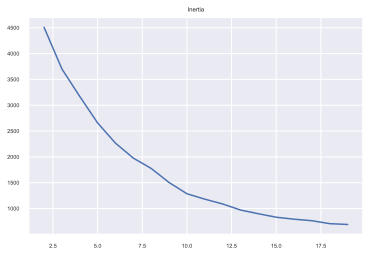

In [168]:
inertia_arr = []
for i in range(2, 20):
    tmp_model = KMeans(n_clusters=i, random_state=42)
    tmp_model.fit(df_train_scaled[col_for_viz])
    tmp_inertia = tmp_model.inertia_
    print(tmp_inertia)
    inertia_arr.append(tmp_inertia)
    
plt.plot([i for i in range(2,20)], inertia_arr)
plt.title('Inertia')

без кластеризации - train - 0,901, test - 0,755, cv ~ 0,768
после кластеризации - train - 0,9, test - 0,754, cv ~ 0,767
Примерно одинаковые модели, немного хуже с кластеризацией

### Построение модели для предсказания цены за квадратный метр

Построим модель для предсказания цены за квадратный метр, чтобы можно было сравнить прогнозы, либо усреднить их

In [ ]:
"""
features = ['Rooms', 'Square', 'LifeSquare', 'KitchenSquare', 'Floor', 
            'HouseFloor', 'HouseYear', 'Ecology_1',  
            'Social_1', 'Social_2', 'Social_3', 'Helthcare_2', 'Shops_1', 'Shops_2']
'''
new_features = [ 'KitchenPerc',  
                'NanLifeSquare', 'MeanSquareByRooms', 
                'DeviaSquareByRooms', 'RatioSquareToMean', 'DistrictSize', 
                'MedPriceByDistrict', 'MedSquareByRooms', 
                'MedPriceByRoomsDist', 'RatioHealthcareToSocial']
#'OutliersSquare', 'OutliersKitchen', 'OutliersRooms', 'bigger_then_mean'
'''
new_features = [ 'MeanSquareByRooms', 'DeviaSquareByRooms', 'RatioSquareToMean', 'DistrictSize', 'IsDistrictLarge',
                'MedPriceByDistrict', 'MedPriceByRooms']

target = 'PriceBySquare'

X = df_train[features + new_features]
Y_1 = df_train[target]

X_train, X_test, Y_1_train, Y_1_test = train_test_split(X, Y_1, test_size=0.3, random_state=21, shuffle=True)
"""

In [ ]:
# rf_1 = RandomForestRegressor(max_depth=8, max_features=11, n_estimators=400, random_state=21)
 
# rf_1.fit(X_train, Y_1_train)
# Y_1_train_preds = rf_1.predict(X_train)
# Y_1_test_preds = rf_1.predict(X_test)

# evaluate_preds(Y_1_train, Y_1_train_preds, Y_1_test, Y_1_test_preds)

In [ ]:
# params = {'max_depth' : [7,8, 9, 10, 11],
#           'max_features' : [6, 7, 8, 9, 10],
#           'n_estimators' : [150, 200, 250, 300]}

# GridSearch = GridSearchCV (rf_1, params, scoring='r2', 
#                           cv=KFold(n_splits = 5, random_state=21, shuffle=True))
# GridSearch.fit(X_train, Y_1_train)

In [ ]:
# GridSearch.best_params_

In [ ]:
# feature_importances = pd.DataFrame(zip(X_train.columns, rf_1.feature_importances_), 
#                                    columns=['feature_name', 'importance'])
# feature_importances.sort_values(by='importance', ascending=False)

### Перекрестная проверка для цены за квадратный метр

In [ ]:
# cv_score = cross_val_score(
#     rf_1,
#     X.fillna(-9999),
#     Y_1,
#     scoring='r2',
#     cv=KFold(n_splits=5, shuffle=True, random_state=1)
# )
# cv_score

In [ ]:
# cv_score.mean(), cv_score.std()

In [ ]:
# cv_score.mean() - cv_score.std(), cv_score.mean() + cv_score.std()

In [ ]:
# df_test['PriceBySquare'] = rf_1.predict(df_test[features + new_features])

### Сохранение данных

In [130]:
df_train.to_csv(PREPARED_TRAIN_DATASET_PATH, index=False, encoding='utf-8')
df_test.to_csv(PREPARED_TEST_DATASET_PATH, index=False, encoding='utf-8')

### Построение модели для предсказания цены на недвижимость

In [131]:
df_train.columns.to_list()[2:]

['Rooms',
 'Square',
 'LifeSquare',
 'KitchenSquare',
 'Floor',
 'HouseFloor',
 'HouseYear',
 'Ecology_1',
 'Ecology_2',
 'Ecology_3',
 'Social_1',
 'Social_2',
 'Social_3',
 'Healthcare_1',
 'Helthcare_2',
 'Shops_1',
 'Shops_2',
 'Price',
 'OutliersSquare',
 'OutliersLifeSquare',
 'MismatchedSquares',
 'OutliersKitchen',
 'OutliersRooms',
 'NanLifeSquare',
 'nan_Healthcare',
 'AB',
 'BA',
 'BB',
 'MeanSquareByRooms',
 'DeviaSquareByRooms',
 'RatioSquareToMean',
 'DistrictSize',
 'MedPriceByDistrict',
 'MedPriceByHouseYear',
 'MedPricePerM2ByHouseYear',
 'MedPricePerM2ByDistrict',
 'MedPriceByRooms',
 'MedSquareByRoomsDist',
 'MedPriceByRoomsDist',
 'HealthcareToSocial',
 'IsDistrictLarge',
 'TotalAppartsByYear',
 'IsHouseOld',
 'IsHouseYearPopular',
 'RatioLifeSquareToSquare',
 'MeanLifeSquareByRooms']

In [172]:
features = ['Rooms', 'Square', 'LifeSquare', 'KitchenSquare', 'Floor', 
            'HouseFloor', 'HouseYear', 'Ecology_1', 'Ecology_2', 'Ecology_3', 
            'Social_1', 'Social_2', 'Social_3', 'Helthcare_2', 'Shops_1', 'Shops_2']

# new_features = ['OutliersRooms', 'OutliersSquare', 'KitchenPerc', 'OutliersKitchen',
#                 'NanLifeSquare', 'AB', 'BA', 'BB', 'MeanSquareByRooms', 'DeviaSquareByRooms',
#                  'DistrictSize', 'MedPriceByDistrict',
#                 'MedPricePerM2ByDistrict', 'MedSquareByRoomsDist', 'MedPriceByRoomsDist',
#                 'HealthcareToSocial', 'IsDistrictLarge', 'TotalAppartsByYear',
#                 'IsHouseOld', 'IsHouseYearPopular', 'RatioLifeSquareToSquare',
#                  'MeanLifeSquareByRooms', 'MedPriceByRooms', 'RatioSquareToMean']
new_features = ['OutliersSquare', 'OutliersLifeSquare', 'MismatchedSquares', 'OutliersKitchen',
                'OutliersRooms', 'NanLifeSquare', 'nan_Healthcare', 'AB', 'BA', 'BB', 'MeanSquareByRooms',
                'DeviaSquareByRooms', 'RatioSquareToMean', 'DistrictSize', 'MedPriceByDistrict', 
                'MedPriceByHouseYear', 'MedPricePerM2ByHouseYear',
                'MedPricePerM2ByDistrict', 'MedPriceByRooms', 'MedSquareByRoomsDist',
                'MedPriceByRoomsDist', 'HealthcareToSocial', 'IsDistrictLarge',
                'TotalAppartsByYear', 'IsHouseOld', 'IsHouseYearPopular',
                'RatioLifeSquareToSquare', 'MeanLifeSquareByRooms', 'DistrictCluster']
# 

target = 'Price'

X = df_train[features + new_features]
Y_2 = df_train[target]

X_train, X_test, Y_2_train, Y_2_test = train_test_split(X, Y_2, test_size=0.3, random_state=42, shuffle=True)

Train R2:	0.9
Test R2:	0.754


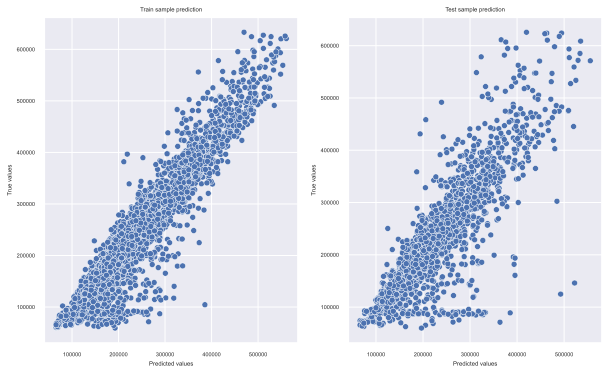

In [173]:
rf_2 = RandomForestRegressor(max_depth=13, max_features=9, n_estimators=1000, min_samples_leaf=3, random_state=21)
#  
rf_2.fit(X_train, Y_2_train)
Y_2_train_preds = rf_2.predict(X_train)
Y_2_test_preds = rf_2.predict(X_test)

evaluate_preds(Y_2_train, Y_2_train_preds, Y_2_test, Y_2_test_preds)

In [174]:
cv_score = cross_val_score(
    rf_2,
    X_train.fillna(-9999),
    Y_2_train,
    scoring='r2',
    cv=KFold(n_splits=5, shuffle=True, random_state=40)
)
cv_score

array([0.76808884, 0.77808413, 0.76211638, 0.77712872, 0.74871197])

In [175]:
cv_score.mean(), cv_score.std()

(0.7668260057953009, 0.010814664888479337)

In [176]:
cv_score.mean() - cv_score.std(), cv_score.mean() + cv_score.std()

(0.7560113409068215, 0.7776406706837803)

In [137]:
feature_importances = pd.DataFrame(zip(X_train.columns, rf_2.feature_importances_), 
                                   columns=['feature_name', 'importance'])
feature_importances.sort_values(by='importance', ascending=False)

,feature_name,importance
30,MedPriceByDistrict,0.136250
36,MedPriceByRoomsDist,0.132044
31,MedPriceByHouseYear,0.079253
1,Square,0.077481
35,MedSquareByRoomsDist,0.040561
29,DistrictSize,0.039753
2,LifeSquare,0.036647
27,DeviaSquareByRooms,0.035199
28,RatioSquareToMean,0.034301
33,MedPricePerM2ByDistrict,0.030602


### Теперь сделаем предсказания на test_df

In [ ]:
df_test.info()

In [ ]:

'''
features = ['Rooms', 'Square', 'LifeSquare', 'KitchenSquare', 'Floor', 
            'HouseFloor', 'HouseYear', 'Ecology_1', 'Ecology_2', 'Ecology_3', 
            'Social_1', 'Social_2', 'Social_3', 'Helthcare_2', 'Shops_1', 'Shops_2']

new_features = ['AB', 'BA', 'BB', 'MeanSquareByRooms', 'DeviaSquareByRooms',
                'RatioSquareToMean', 'DistrictSize', 'IsDistrictLarge',
                'MedPriceByDistrict', 'MedPriceByRooms', 'MedPriceByRoomsDist',  
                'OutliersSquare', 'OutliersKitchen', 'OutliersRooms', 'KitchenPerc']
'''
X_train_f = df_train[features + new_features]
Y_train_f = df_train['Price']
X_test_f = df_test[features + new_features]

rf_2 = RandomForestRegressor(max_depth=20, max_features=5, n_estimators=1000, random_state=21)
# max_depth=19, max_features=5, n_estimators=400,
rf_2.fit(X_train_f, Y_train_f)

Y_test_f = rf_2.predict(X_test_f)
Id = df_test['Id'].values

In [ ]:
# df_test['Price2'] =  df_test['PriceBySquare'] * df_test['Square']
# Price = (df_test['Price2'].values + Y_test_f)/2
# Price

In [ ]:
Y_test = pd.DataFrame({'Id': Id, 'Price':Y_test_f}, columns=['Id','Price'])
Y_test.to_csv('Sokolova_predictions_10.csv', header=True, index=False, encoding='utf-8')

* Предсказательная модель для цены за квадратный метр
* Предсказательная модель для цены
* Добавить столбец Цена исходя из цены за квадрат
* Усреднение прогноза